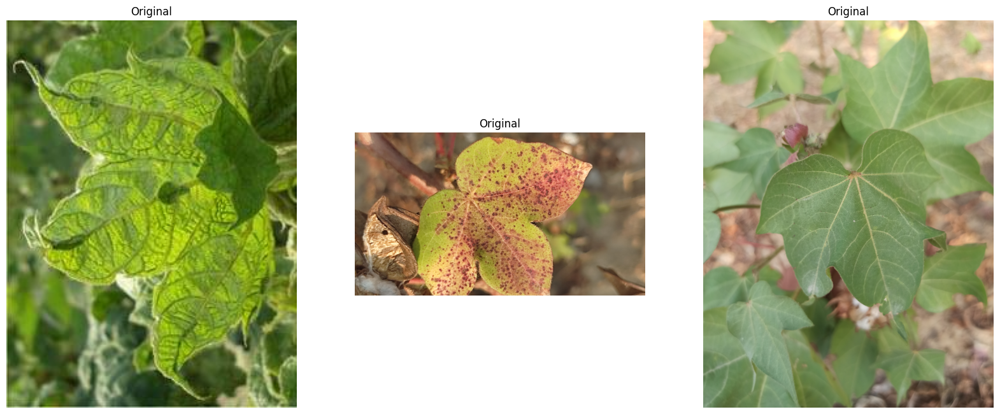

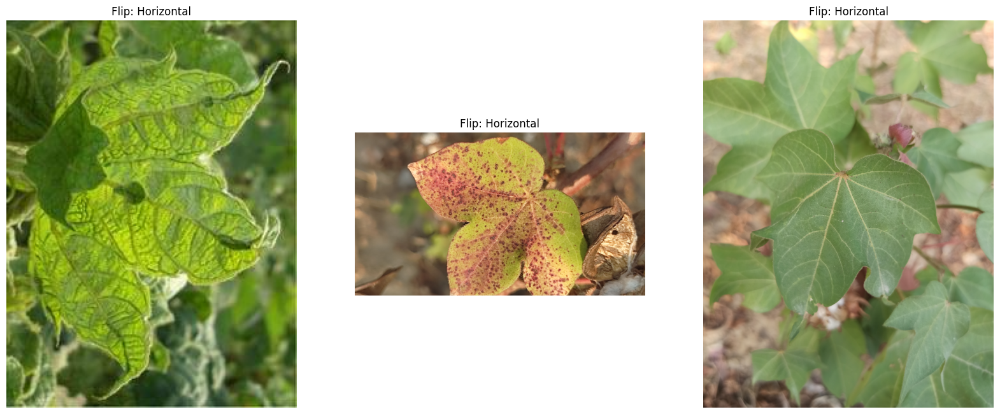

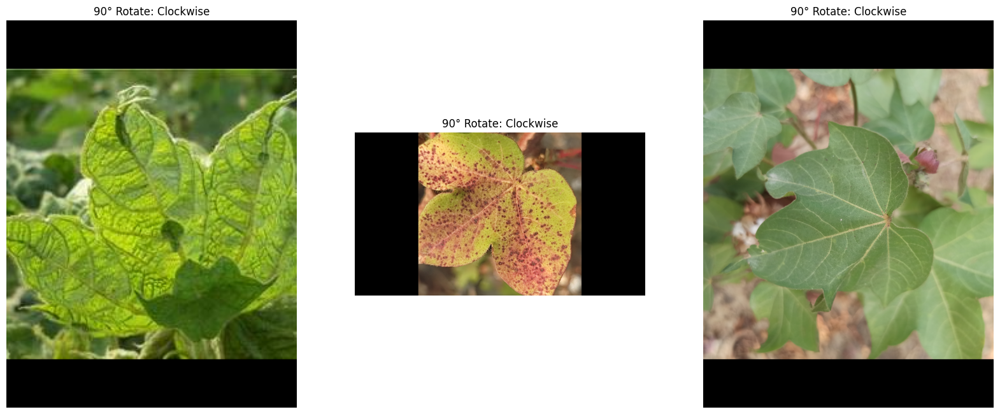

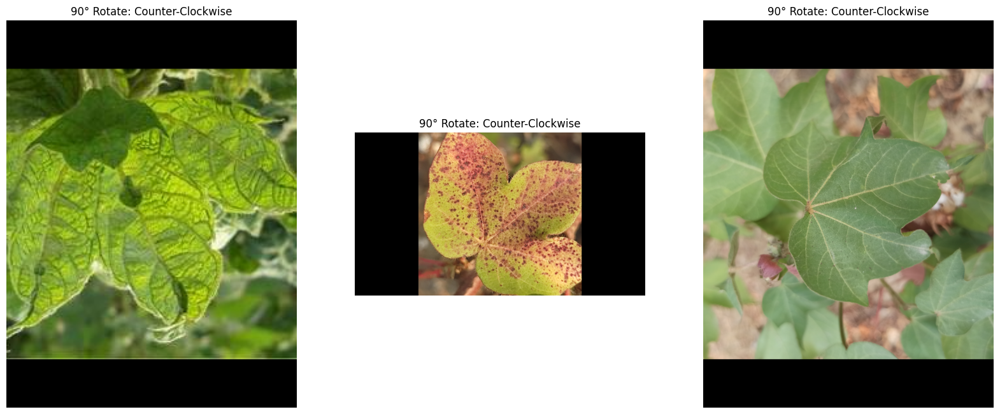

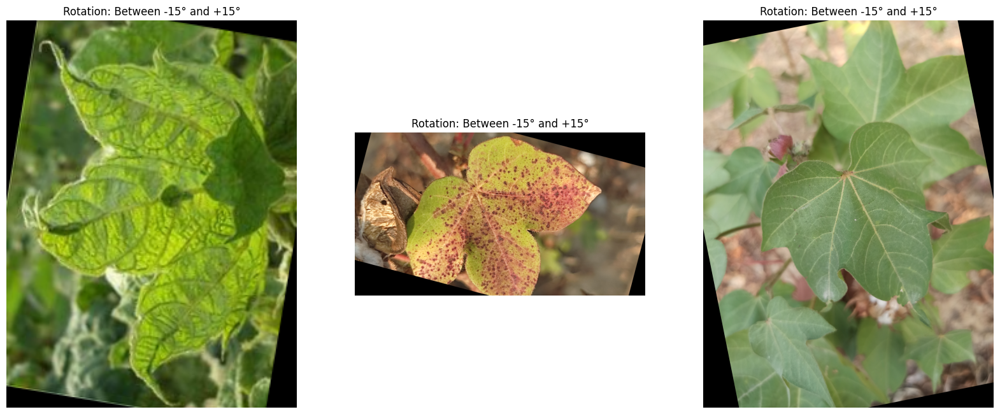

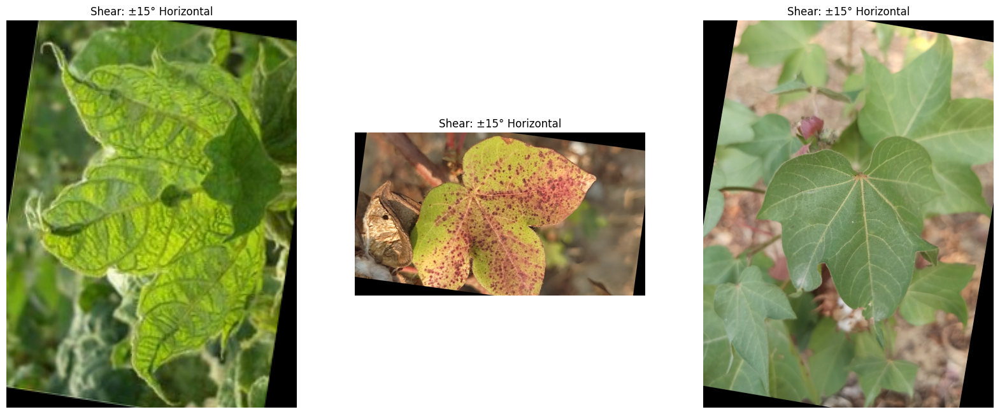

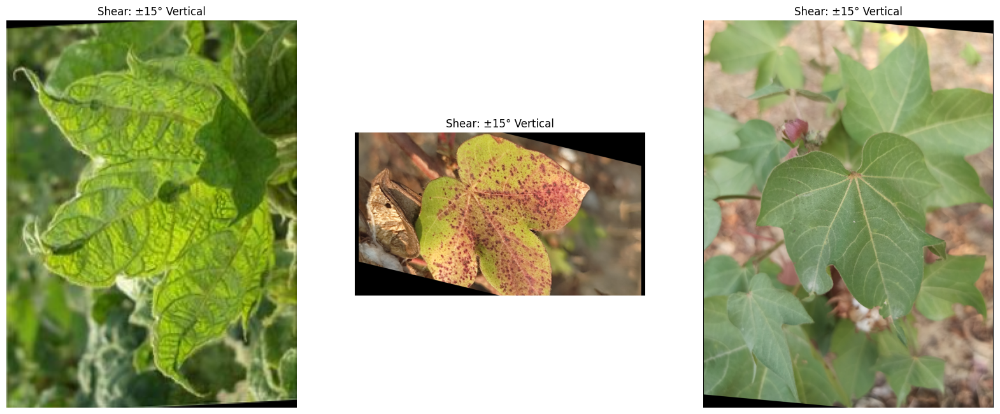

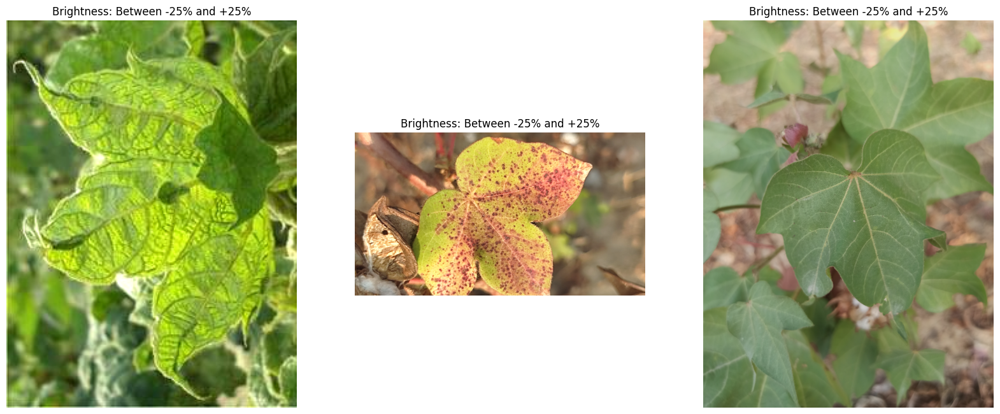

In [6]:
import os
import cv2
import imgaug as ia
import imgaug.augmenters as iaa
import numpy as np
import matplotlib.pyplot as plt

def load_images(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

def augment_and_display(images):
    augmentations = [
        ("Flip: Horizontal", iaa.Fliplr(1)),
        ("90° Rotate: Clockwise", iaa.Rotate(90)),
        ("90° Rotate: Counter-Clockwise", iaa.Rotate(-90)),
        ("Rotation: Between -15° and +15°", iaa.Affine(rotate=(-15, 15))),
        ("Shear: ±15° Horizontal", iaa.Affine(shear=(-15, 15))),
        ("Shear: ±15° Vertical", iaa.Affine(shear={"x": (0, 0), "y": (-15, 15)})),
        ("Brightness: Between -25% and +25%", iaa.Multiply((0.75, 1.25)))
    ]

    plt.figure(figsize=(20, 10))
    for i, img in enumerate(images, 1):
        plt.subplot(1, len(images), i)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original")
        plt.axis("off")

    for aug_name, aug in augmentations:
        plt.figure(figsize=(20, 10))
        for i, img in enumerate(images, 1):
            plt.subplot(1, len(images), i)
            aug_img = aug.augment_image(img)
            plt.imshow(cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB))
            plt.title(f"{aug_name}")
            plt.axis("off")
    plt.show()

folder_path = "dataset"
images = load_images(folder_path)
augment_and_display(images)





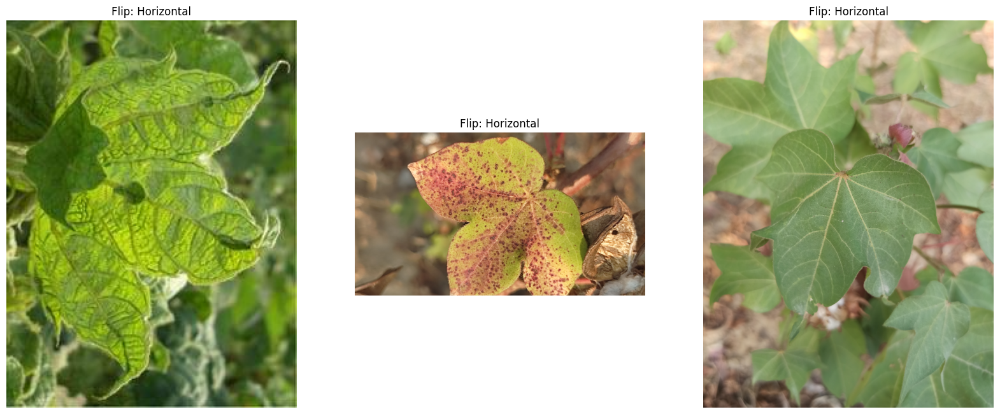

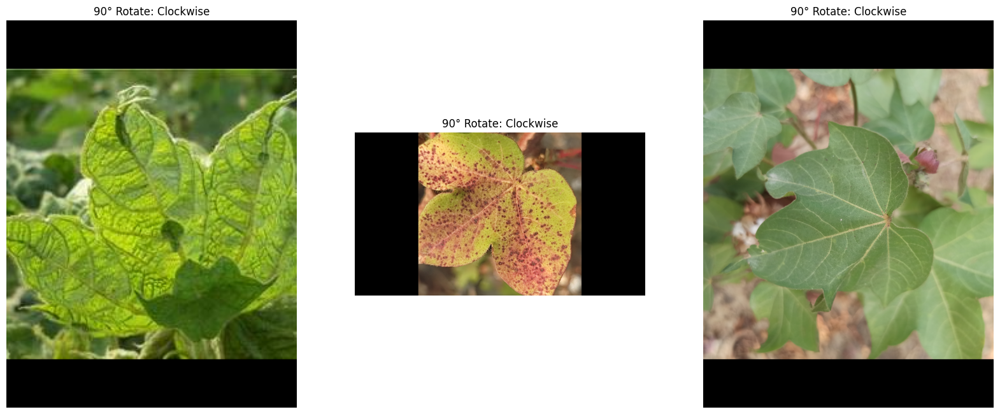

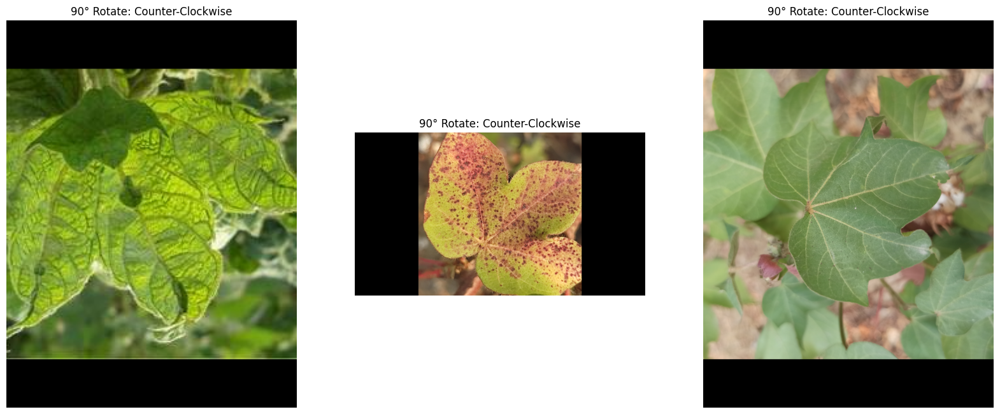

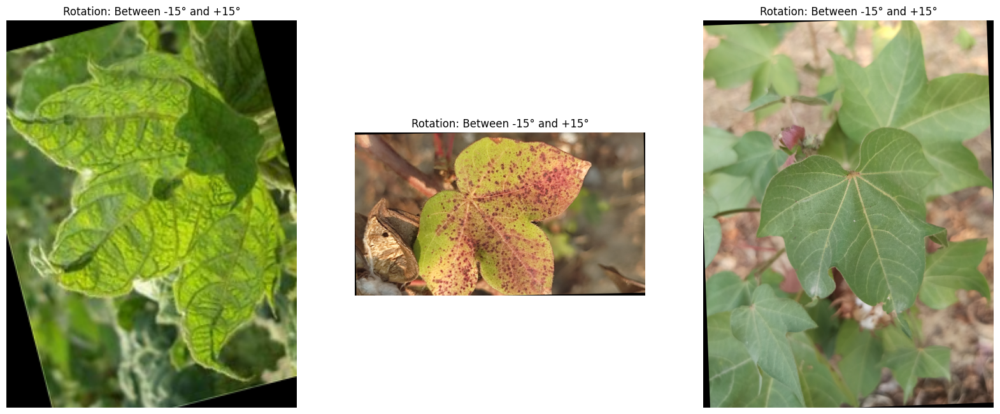

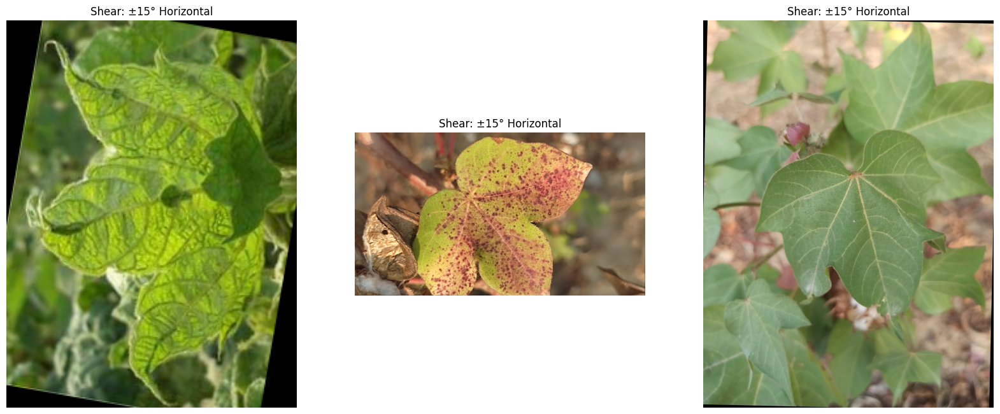

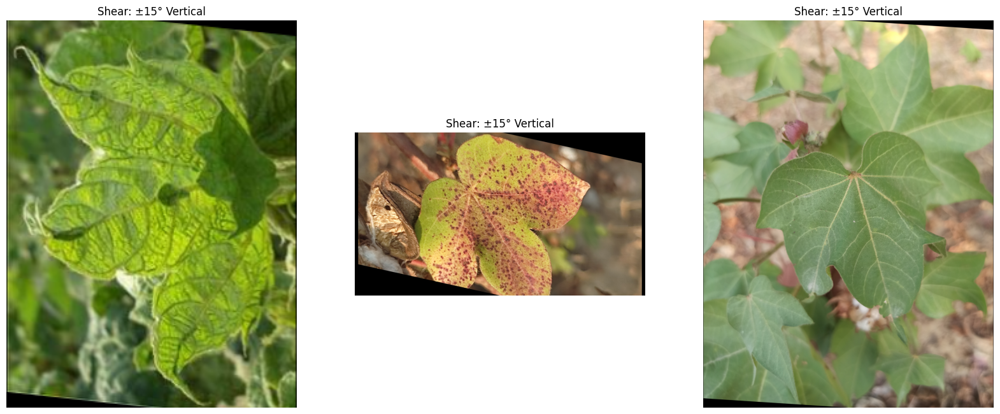

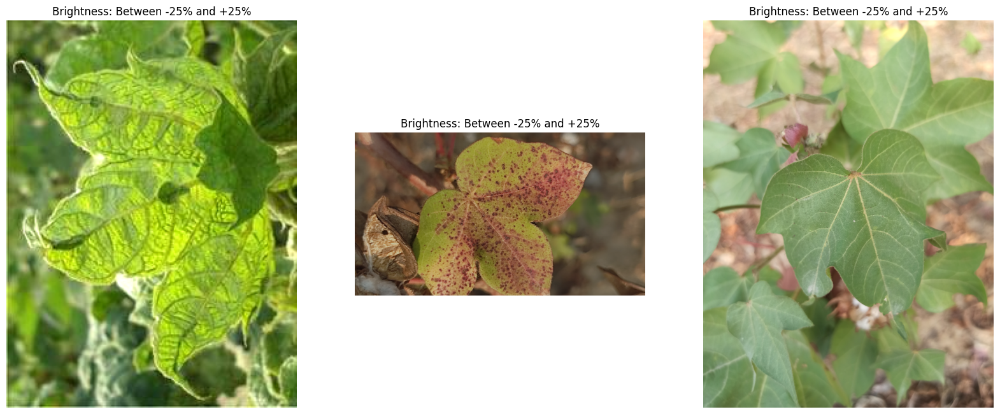

In [11]:
import os
import cv2
import imgaug as ia
import imgaug.augmenters as iaa
import numpy as np
import matplotlib.pyplot as plt

def load_images(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

def augment_and_display(images, save_path):
    # Create a folder to save the images if it doesn't exist
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    # Save original images
    for i, img in enumerate(images, 1):
        cv2.imwrite(os.path.join(save_path, f"original_{i}.jpg"), img)

    # Apply augmentations, display and save images
    for aug_name, aug in augmentations:
        plt.figure(figsize=(20, 10))
        for i, img in enumerate(images, 1):
            aug_img = aug.augment_image(img)
            plt.subplot(1, len(images), i)
            plt.imshow(cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB))
            plt.title(f"{aug_name}")
            plt.axis("off")

            # Save the augmented image
            img_name = f"{aug_name.replace(' ', '_').replace(':', '').replace('±', 'plusminus')}_{i}.jpg"
            cv2.imwrite(os.path.join(save_path, img_name), aug_img)
    plt.show()

folder_path = "dataset"
save_path = "Documents"

images = load_images(folder_path)

augmentations = [
    ("Flip: Horizontal", iaa.Fliplr(1)),
    ("90° Rotate: Clockwise", iaa.Rotate(90)),
    ("90° Rotate: Counter-Clockwise", iaa.Rotate(-90)),
    ("Rotation: Between -15° and +15°", iaa.Affine(rotate=(-15, 15))),
    ("Shear: ±15° Horizontal", iaa.Affine(shear=(-15, 15))),
    ("Shear: ±15° Vertical", iaa.Affine(shear={"x": (0, 0), "y": (-15, 15)})),
    ("Brightness: Between -25% and +25%", iaa.Multiply((0.75, 1.25)))
]

augment_and_display(images, save_path)
